# Week 10 - Initial Value Problems
## Kiran Shila - U54532811

In [145]:
using DifferentialEquations
using Plots
using ParameterizedFunctions
using LinearAlgebra
using BenchmarkTools

The `DifferentialEquations.jl` package is a HUGE component of the Julia language. It has many many solvers and setup configurations.

We start by defining the problem to solve - the DE for an RL circuit
\begin{equation}
\frac{dI}{dt} = -\frac{R}{L}I(t) + \frac{V}{L}
\end{equation}

Where $I(0) = I_0$

Now we will make the following assumptions:
$R= 1,L= 1,$ and $E_o= 1$

## Deliverable 1
We have to set up the problem so we can numerically integrate the IVP in (11) given the initial condition in (12) over the time interval [0,10] using the following methods:
* Eler Method
* Implicit Euler Method
* Fourth/Fifth order Runge-Kutta

The analytic solution is 
\begin{equation}
I(t) = Ce^{-\alpha t} + \frac{E_0}{R}
\end{equation}

with

\begin{equation}
\alpha=\frac{R}{L}, C=I_0-\frac{E_0}{R}
\end{equation}

Let's first look at the analytic solution with the function definition and the time step

In [2]:
# Analytic Solution
I(t::Number,R::Number,L::Number,E_0::Number,I_0::Number) = (I_0-(E_0/R))*exp(-(R/L)*t) + (E_0/R)
# Time vector to take points at
timeVec = range(0,10,step=0.1)

0.0:0.1:10.0

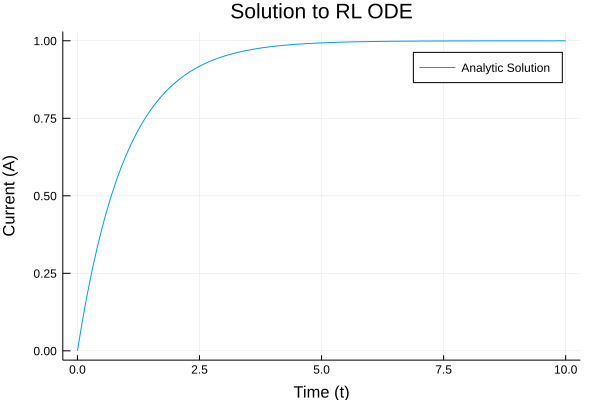

In [3]:
plot(timeVec,[I(t,1,1,1,0) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RL ODE")

### Euler Method
Julia's `DE.jl` package has builtins for Euler and Implicit Euler. I just have to set up the equation using the values of $R,L,$ and $E_0$

In [4]:
dIdt(u,p,t) = -1.0*u+1.0
u0=0.0
tspan = (0.0,10.0)
prob = ODEProblem(dIdt,u0,tspan)

ODEProblem with uType Float64 and tType Float64. In-place: false
timespan: (0.0, 10.0)
u0: 0.0

And now solving using Euler's Method - with a 0.1 second time step

In [5]:
sol = solve(prob,Euler(),dt=0.1); # Supressing the output

 Comparing the results

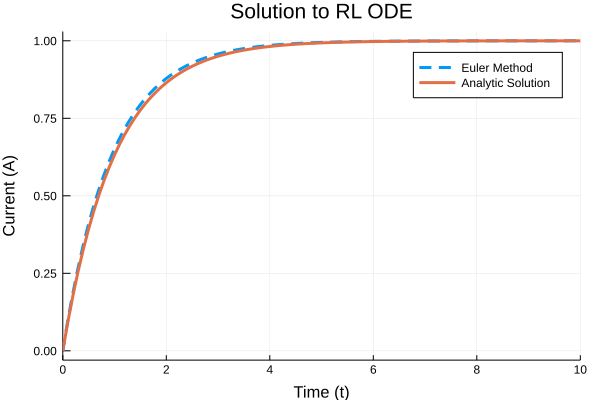

In [6]:
plot(sol,label="Euler Method",ls=:dash)
plot!(timeVec,[I(t,1,1,1,0) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RL ODE",lw=3)

Now with a few different step sizes

In [7]:
sol1 = solve(prob,Euler(),dt=0.001)
sol2 = solve(prob,Euler(),dt=0.01)
sol3 = solve(prob,Euler(),dt=1)
sol4 = solve(prob,Euler(),dt=1.5)

retcode: Success
Interpolation: 3rd order Hermite
t: 8-element Array{Float64,1}:
  0.0
  1.5
  3.0
  4.5
  6.0
  7.5
  9.0
 10.0
u: 8-element Array{Float64,1}:
 0.0     
 1.5     
 0.75    
 1.125   
 0.9375  
 1.03125 
 0.984375
 1.0     

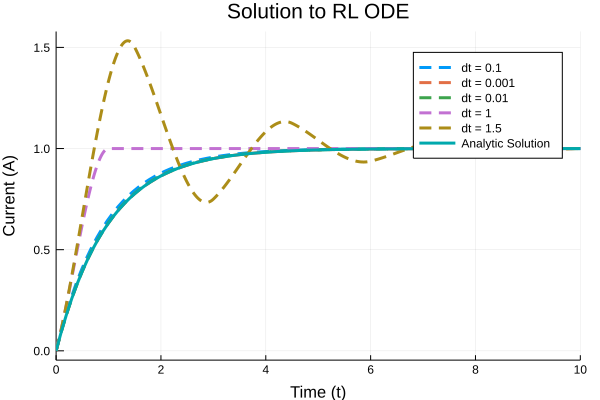

In [8]:
plot(sol,label="dt = 0.1",ls=:dash)
plot!(sol1,label="dt = 0.001",ls=:dash)
plot!(sol2,label="dt = 0.01",ls=:dash)
plot!(sol3,label="dt = 1",ls=:dash)
plot!(sol4,label="dt = 1.5",ls=:dash)
plot!(timeVec,[I(t,1,1,1,0) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RL ODE",lw=3)

Interesting results - It seems as though the problem itself changed when the timestep went to 1.5. It looks like a damped oscillator instead of overdamped.

### Implicit Euler
Once again, using builtin Julia functions, ImplicitEuler() will do adaptive timestepping. They say this is for stiff problems.

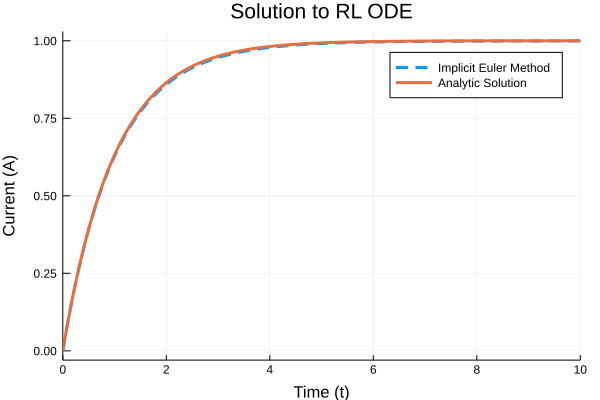

In [9]:
sol = solve(prob,ImplicitEuler())
plot(sol,label="Implicit Euler Method",ls=:dash)
plot!(timeVec,[I(t,1,1,1,0) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RL ODE",lw=3)

Looks closer than the Euler method.

### Runge-Kutta

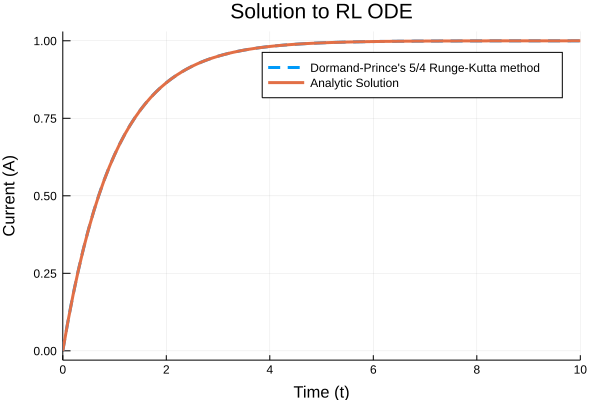

In [10]:
sol = solve(prob,DP5()) # Julia version of MATLAB's ode45()
plot(sol,label=" Dormand-Prince's 5/4 Runge-Kutta method",ls=:dash)
plot!(timeVec,[I(t,1,1,1,0) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RL ODE",lw=3)

Spot on!

## Deliverable 2
### RLC Circuit
Using the definitions

In [28]:
d2Idt2(du,u,p,t) = (1/0.1)*155*sin(377*t) - (100/0.1)du - (1/(0.1*1e-3))u

d2Idt2 (generic function with 1 method)

In [29]:
u0 = 0.0
du0 = 0.0
tspan = (0.0,1.0)
prob = SecondOrderODEProblem(d2Idt2,du0,u0,tspan)

ODEProblem with uType Tuple{Float64,Float64} and tType Float64. In-place: false
timespan: (0.0, 1.0)
u0: (0.0, 0.0)

The exact solution is

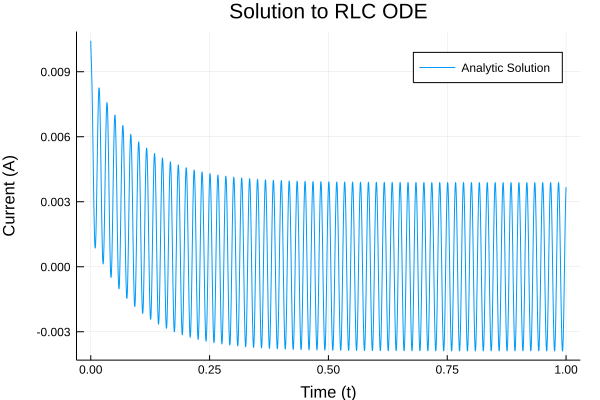

In [30]:
# Analytic Solution
I(t::Number) = 0.005213795953*exp(-10.10205140*t) + 0.001552158513*exp(-989.8979486*t) + 0.003661637439*cos(377*t) + 0.001283311653*sin(377*t)
# Time vector to take points at
timeVec = range(0,1,step=0.0001)
plot(timeVec,[I(t) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RLC ODE")

And now to solve with the same timestep

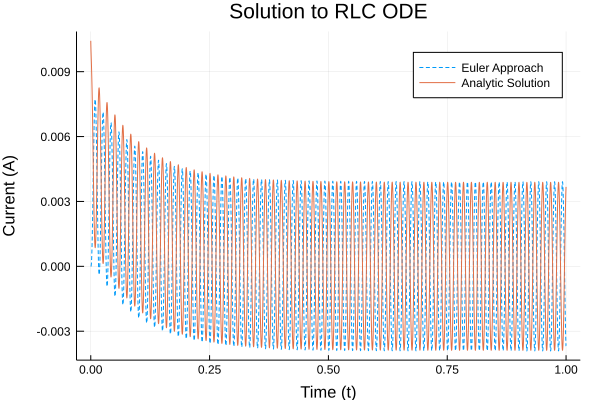

In [31]:
sol = solve(prob,Euler(),dt=0.0001)
timeVecSol = range(0,1,length=length(sol[2,:]))
plot(timeVecSol,sol[2,:],lw=1,ls=:dash,label="Euler Approach")
plot!(timeVec,[I(t) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RLC ODE",lw=1)

Close, but not quite. Obviosuly we can make it bad by having a better timestep

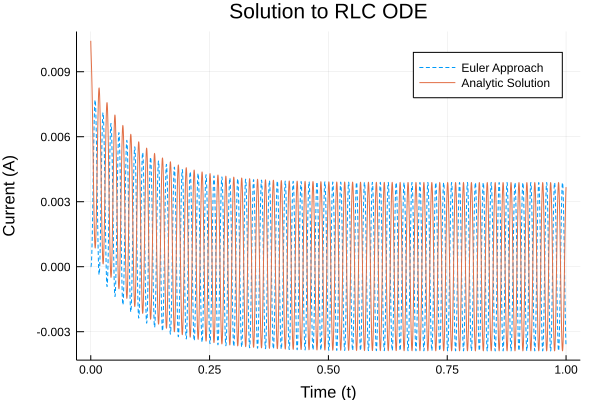

In [32]:
sol = solve(prob,Euler(),dt=0.00001)
timeVecSol = range(0,1,length=length(sol[2,:]))
plot(timeVecSol,sol[2,:],lw=1,ls=:dash,label="Euler Approach")
plot!(timeVec,[I(t) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RLC ODE",lw=1)

Doesn't look much better, it may take more RAM than I have

Now with runge-kutta

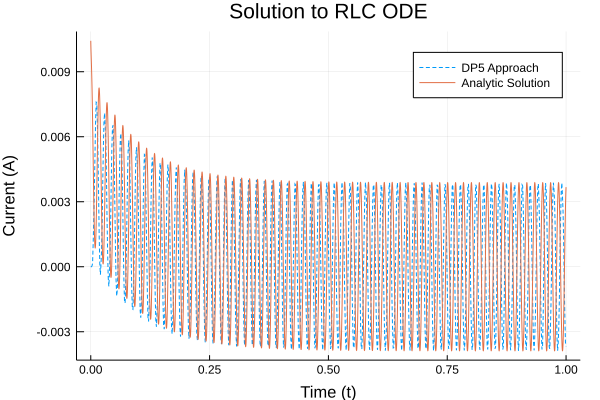

In [33]:
sol = solve(prob,DP5())
timeVecSol = range(0,1,length=length(sol[2,:]))
plot(timeVecSol,sol[2,:],lw=1,ls=:dash,label="DP5 Approach")
plot!(timeVec,[I(t) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RLC ODE",lw=1)

It looks about the same, maybe the analytic solution was weird

If we try a bad timestep

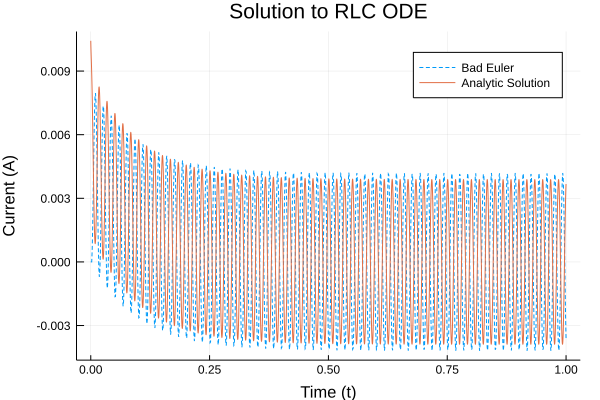

In [36]:
sol = solve(prob,Euler(),dt=0.001)
timeVecSol = range(0,1,length=length(sol[2,:]))
plot(timeVecSol,sol[2,:],lw=1,ls=:dash,label="Bad Euler")
plot!(timeVec,[I(t) for t in timeVec], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RLC ODE",lw=1)

So this is close to the solution from RK. If we had to pick a time step, it would be near here just so we can capture the harmonic content.

## Deliverable 3 - Rosenbrock Method
Even though Julia DE.jl has this builtin

This is the algorith for the 4th order Rosenbrock solver

In [114]:
function rosen4(f::Function, tspan::StepRangeLen, x₀)
    # Constants
    γ = 0.5
    a₂₁ = 2.0; a₃₁ = 1.92; a₃₂ = 0.24
    c₂₁ = -8.0; c₃₁ = 14.88; c₃₂ = 2.4; c₄₁ = -0.896
    c₄₂ = -0.432; c₄₃ = -0.4
    b₁ = 19.0/9.0; b₂ = 0.5; b₃ = 25.0/108.0; b₄ = 125.0/108.0
    e₁ = 17.0/54.0; e₂ = 7.0/36.0; e₃ = 0; e₄ = 125.0/108.0
    c₁ = 0.5; c₂ = -1.5; c₃= 2.42; c₄ = 0.116
    a₂ = 1; a₃ = 0.6; a₄ = 3.0/5

    # Create time array
    time = Array(tspan)

    # Intial guess and Solution Vector
    xₛ = [x₀]

    # Get time step
    Δt = time[2]-time[1]

    # Iterate
    for (i,t) in enumerate(time)
        # Get last x
        x = xₛ[end]
        # Get Jacobian
        J = jacobian(f,t,x)
        fₖ = f(t,x)
        df_dt = (f(t+eps()^0.5,x) - fₖ)/(eps()^0.5)
        A = 1/(γ*Δt)*LinearAlgebra.I - J
        L,U = lu(A)
        # i = 1
        b = fₖ + Δt*c₁*df_dt
        y = L \ b
        g₁ = U \ y
        #3 i = 2
        b = f(t+a₂, x+a₂₁*g₁) + Δt*c₂*df_dt+(c₂₁*g₁)/Δt
        y = L \ b
        g₂ = U \ y
        # i = 3
        b = f(t+a₃, x+a₃₁*g₁+a₃₂*g₂) + Δt*c₃*df_dt+(c₃₁*g₁+c₃₂*g₂)/Δt
        y = L \ b
        g₃ = U \ y
        # i = 4
        b = f(t+a₄, x+a₃₁*g₁+a₃₂*g₂) + Δt*c₄*df_dt+(c₄₁*g₁+c₄₂*g₂+c₄₃*g₃)/Δt
        y = L \ b
        g₄ = U \ y
        # Set next x
        push!(xₛ, x + b₁ .* g₁ + b₂ .* g₂ + b₃ .* g₃ + b₄ .* g₄)
    end

    # Return the solution
    return [i[1] for i in xₛ]
end

rosen4 (generic function with 2 methods)

In [113]:
function jacobian(f::Function,t,x)
    # Evaluate function at t,x
    fₖ = f(t,x)

    # Get number of unknowns
    N = length(fₖ)

    # Create solution matrix
    J = zeros(N,N)

    # Loop through unknowns
    for n = 1:N
        en = zeros(N)
        en[n] = 1
        fₖen = f(t,x .+ eps()^0.5 .* en)
        J[:,n] = (fₖen - fₖ) ./ eps()^0.5
    end
    return J
end

jacobian (generic function with 1 method)

In [115]:
function rlc_system(t,y)
    dv_dt = 155*sin(377*t)
    return [y[2],(1/0.1)*dv_dt-(100/0.1)*y[2]-(1/(0.1*0.001))*y[1]]
end

rlc_system (generic function with 1 method)

In [126]:
timeVecSol = 0:0.00001:1
solution = rosen4(rlc_system,timeVecSol,[0.0,0.0])

100002-element Array{Float64,1}:
  0.0                   
  2.0734831905175217e-10
  1.3668211323635827e-9 
  4.05036058679089e-9   
  8.824194567894946e-9  
  1.6248884731085924e-8 
  2.6879374060912183e-8 
  4.1265033963257163e-8 
  5.994971089517279e-8  
  8.347177253701955e-8  
  1.123641535115261e-7  
  1.4715440065436214e-7 
  1.8836471784075316e-7 
  ⋮                     
 -0.0036263022948735207 
 -0.0036314773765852696 
 -0.0036366008420863345 
 -0.003641672618557746  
 -0.0036466926339151847 
 -0.003651660816810006  
 -0.003656577096630254  
 -0.0036614414035016653 
 -0.0036662536682886613 
 -0.0036710138225953324 
 -0.003675721798766408  
 -0.00368037752988822   

In [136]:
plot(solution,lw=1,ls=:dash,label="Rosenbrock")
plot!([I(t) for t in timeVecSol], label="Analytic Solution", xaxis="Time (t)", yaxis="Current (A)", title="Solution to RLC ODE",lw=1)

Same problem, but hey it matches the other solvers.
This solver seems pretty unstable though, as the time step gets larger, it just fails.

In [143]:
timeVecSol = 0:0.0001:1
plot!(rosen4(rlc_system,timeVecSol,[0.0,0.0]))
timeVecSol = 0:0.00001:1
plot!(rosen4(rlc_system,timeVecSol,[0.0,0.0]))

Quick speed test, just to see :)

In [146]:
timeVecSol = 0:0.00001:1
@benchmark rosen4(rlc_system,timeVecSol,[0.0,0.0])

BenchmarkTools.Trial: 
  memory estimate:  685.60 MiB
  allocs estimate:  9400117
  --------------
  minimum time:     1.533 s (17.29% GC)
  median time:      1.581 s (18.77% GC)
  mean time:        1.597 s (20.07% GC)
  maximum time:     1.693 s (25.02% GC)
  --------------
  samples:          4
  evals/sample:     1

In [148]:
@benchmark sol = solve(prob,DP5())

BenchmarkTools.Trial: 
  memory estimate:  3.70 MiB
  allocs estimate:  117337
  --------------
  minimum time:     28.475 ms (0.00% GC)
  median time:      29.528 ms (0.00% GC)
  mean time:        31.271 ms (2.70% GC)
  maximum time:     65.919 ms (0.00% GC)
  --------------
  samples:          160
  evals/sample:     1

lol